# Exploring data

In [1]:
import pandas as pd

import numpy as np

import matplotlib
import matplotlib.pylab as plt
%matplotlib inline

import seaborn as sns

In [2]:
data_filepath = './data/train.csv'
data = pd.read_csv(data_filepath)

In [3]:
data.shape

(878049, 9)

In [4]:
data.head(20)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541
5,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM UNLOCKED AUTO,Wednesday,INGLESIDE,NONE,0 Block of TEDDY AV,-122.403252,37.713431
6,2015-05-13 23:30:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Wednesday,INGLESIDE,NONE,AVALON AV / PERU AV,-122.423327,37.725138
7,2015-05-13 23:30:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Wednesday,BAYVIEW,NONE,KIRKWOOD AV / DONAHUE ST,-122.371274,37.727564
8,2015-05-13 23:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,RICHMOND,NONE,600 Block of 47TH AV,-122.508194,37.776601
9,2015-05-13 23:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,CENTRAL,NONE,JEFFERSON ST / LEAVENWORTH ST,-122.419088,37.807802


In [5]:
cat_colnames = ['Category', 'Descript', 'DayOfWeek', 'PdDistrict', 'Resolution', 'Address']

In [6]:
data[cat_colnames].describe()

,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address
count,878049,878049,878049,878049,878049,878049
unique,39,879,7,10,17,23228
top,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Friday,SOUTHERN,NONE,800 Block of BRYANT ST
freq,174900,60022,133734,157182,526790,26533


## Weekdays

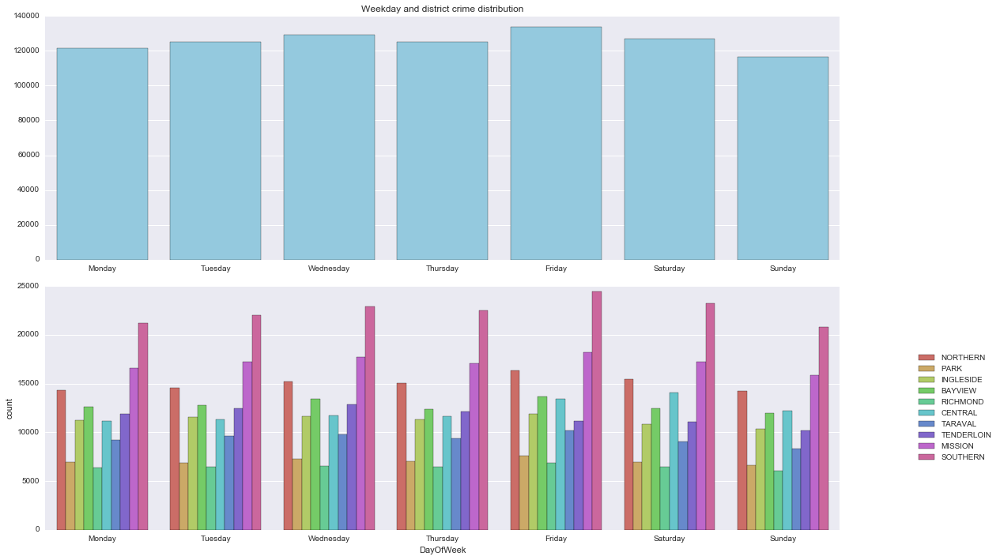

In [7]:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))

weekly_data = data['DayOfWeek'].value_counts()

sns.barplot(x=weekly_data.index, y=weekly_data.values, 
            order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
            ax=ax[0],
            color='skyblue')
ax[0].set_title('Weekday crime distribution')

ax[1] = sns.countplot(x='DayOfWeek', hue='PdDistrict', data=data,
                      order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                      ax=ax[1],
                      palette='hls')
ax[0].set_title('Weekday and district crime distribution')
ax[1].legend(bbox_to_anchor=(1.2, 0.5), loc='right')

fig.tight_layout()

In [8]:
data['Year'] = pd.to_datetime(data['Dates']).apply(lambda x: x.year)

## Years

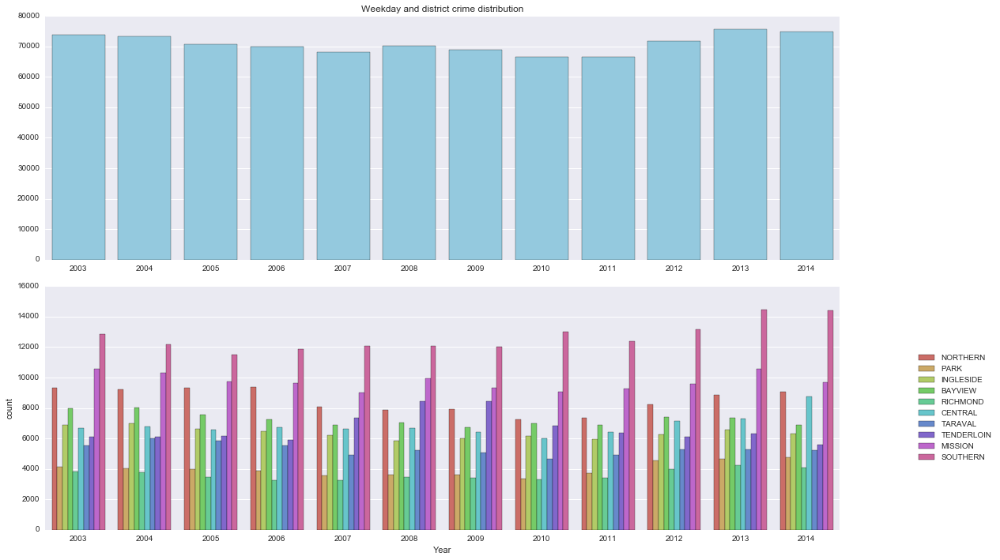

In [9]:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))

year_data = data['Year'].value_counts()

sns.barplot(x=year_data.index, y=year_data.values,
            order=range(2003, 2015), # without 2015, because info is not full
            ax=ax[0],
            color='skyblue')
ax[0].set_title('Year crime distribution')

ax[1] = sns.countplot(x='Year', hue='PdDistrict', data=data,
                      order=range(2003, 2015), # without 2015, because info is not full
                      ax=ax[1],
                      palette='hls')
ax[0].set_title('Weekday and district crime distribution')
ax[1].legend(bbox_to_anchor=(1.2, 0.5), loc='right')


fig.tight_layout()

## Hours

In [10]:
data['Hour'] = pd.to_datetime(data['Dates']).apply(lambda x: x.hour)

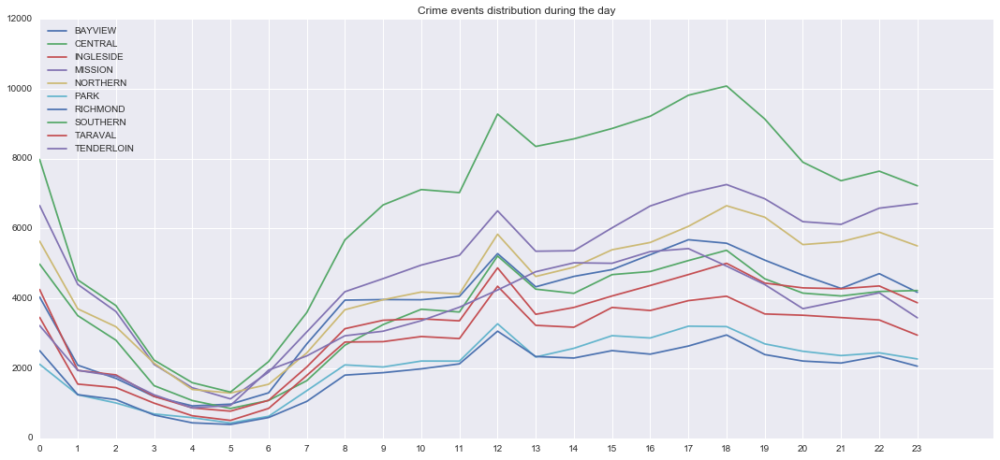

In [11]:
fig, ax = plt.subplots(figsize=(15, 7))

district_hour_group = data['Hour'].groupby(data['PdDistrict'])
for name, group in district_hour_group:
    hour_counts = group.value_counts()
    hour_counts.sort_index(inplace=True)
    
    ax.plot(hour_counts.index, hour_counts.values,
            label=name)

ax.set_title('Crime events distribution during the day')
ax.set_xticks(np.arange(0, 23 + 1, 1))
ax.legend(loc='upper left')

fig.tight_layout()

## Crime map

In [12]:
print min(data['X']), max(data['X'])
print min(data['Y']), max(data['Y'])

-122.513642064 -120.5
37.7078790224 90.0


In [13]:
# Supplied map bounding box:
#    ll.lon     ll.lat   ur.lon     ur.lat
#    -122.52469 37.69862 -122.33663 37.82986
lon_lat_box = (-122.5247, -122.3366, 37.699, 37.8299)
clipsize = [[-122.5247, -122.3366],[ 37.699, 37.8299]]

In [14]:
sf_map_filepath = './data/sf_map.txt'
sf_map_data = np.loadtxt(sf_map_filepath)

In [15]:
data['Category'].value_counts()

LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQUOR LAWS 

In [16]:
from matplotlib.ticker import FormatStrFormatter
def plot_crime_map(data, category, map_data, lon_lat_box):
    sns.set_style("whitegrid", {'axes.grid' : False})
    
    fig, ax = plt.subplots(figsize=(15, 7))

    ax.imshow(map_data, extent=lon_lat_box)
    
    coordinate_index_filter = (data['X'] <= lon_lat_box[1]) & (data['X'] >= lon_lat_box[0]) & \
                              (data['Y'] <= lon_lat_box[3]) & (data['Y'] >= lon_lat_box[2])
    
    x = data[(data['Category'] == category) & coordinate_index_filter].X
    y = data[(data['Category'] == category) & coordinate_index_filter].Y
    
    ax.scatter(x, y, color='Red', s=1)
    
    ax.set_title(category)
    ax.set_xticks(np.linspace(lon_lat_box[0], lon_lat_box[1], 10))
    ax.set_yticks(np.linspace(lon_lat_box[2], lon_lat_box[3], 10))
    
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    
    sns.set_style("whitegrid", {'axes.grid' : True})

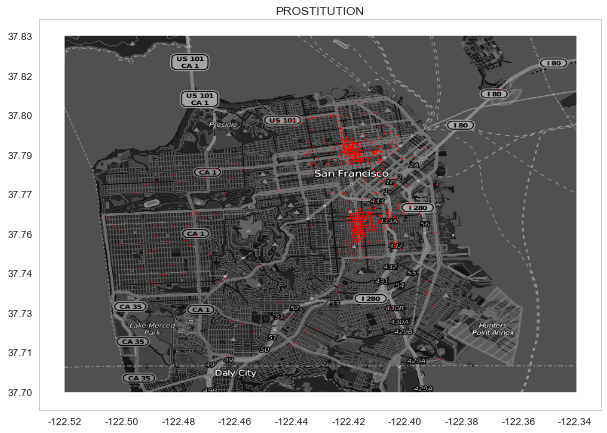

In [17]:
plot_crime_map(data, 'PROSTITUTION', sf_map_data, lon_lat_box)

/Users/karfly/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


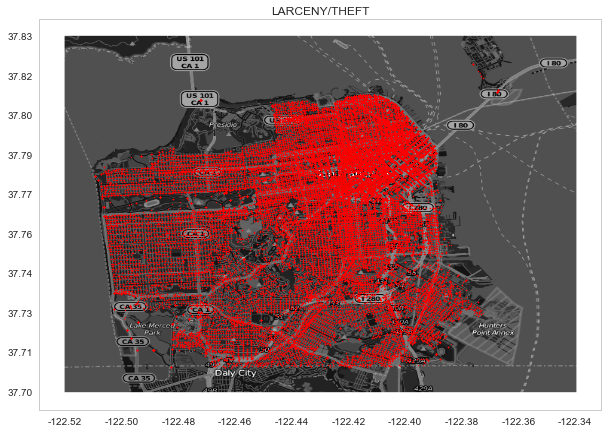

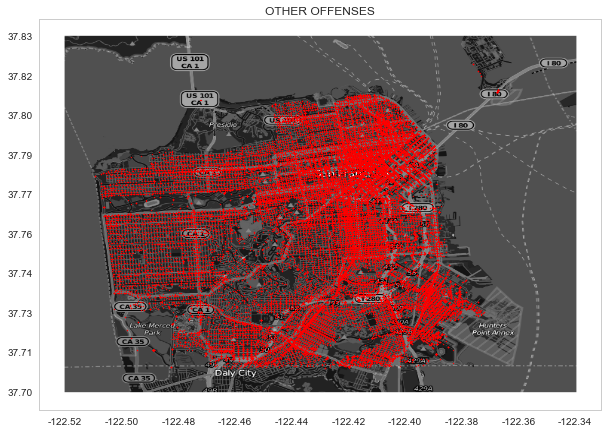

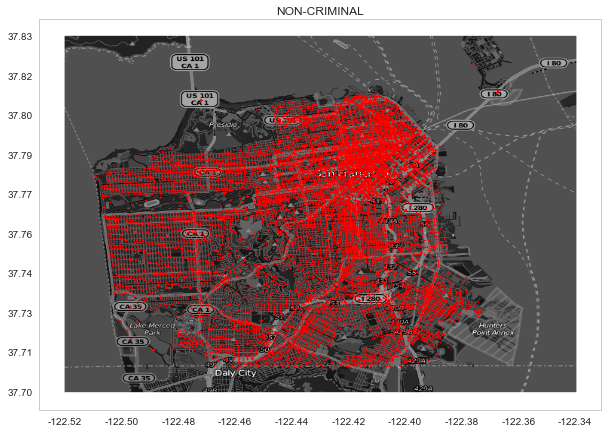

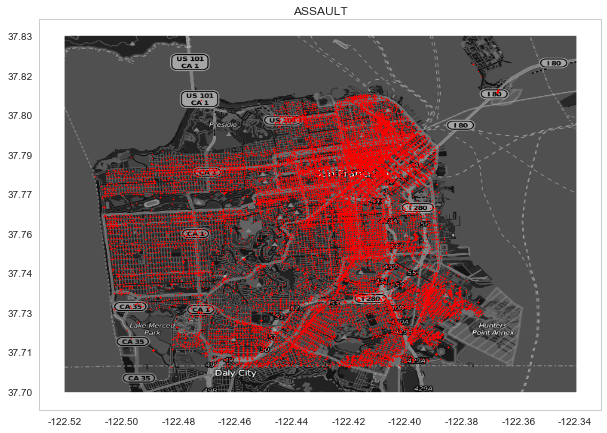

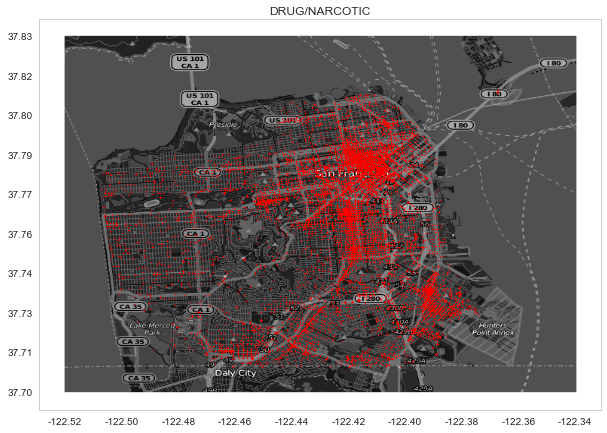

...

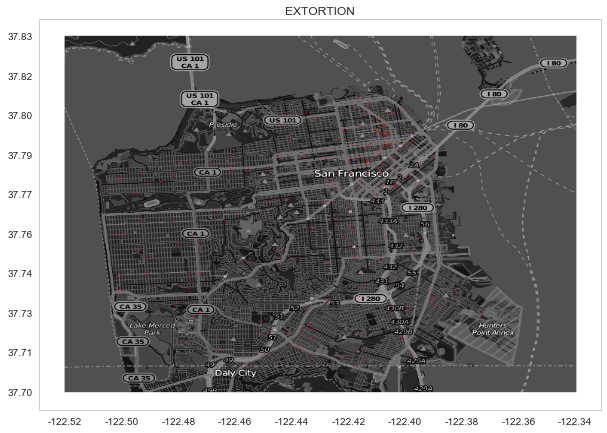

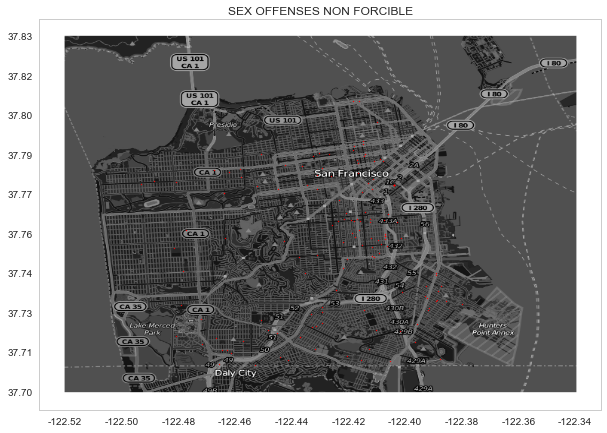

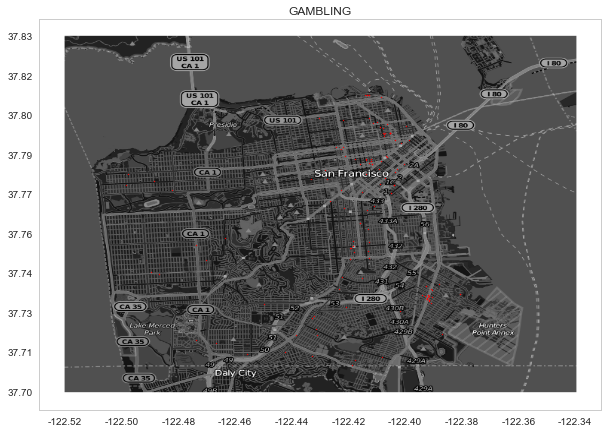

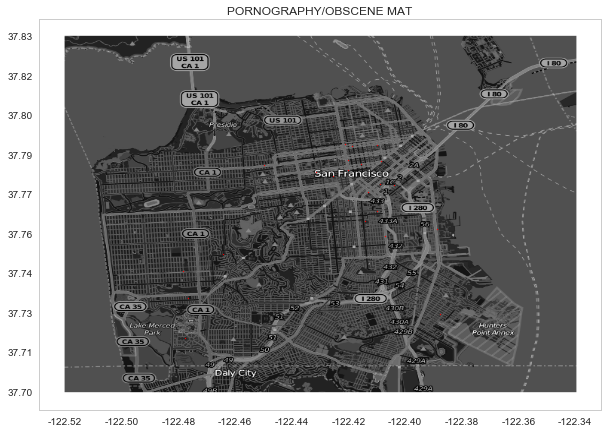

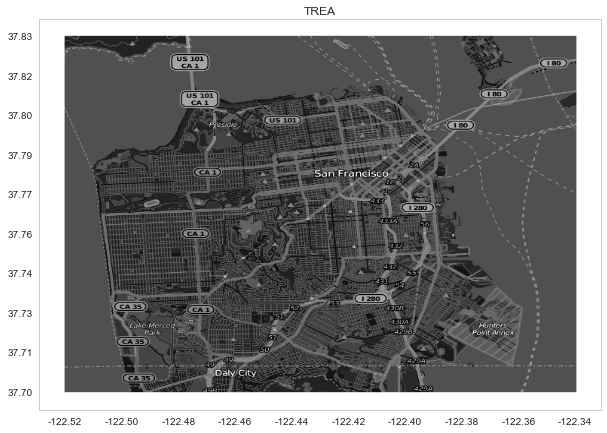

In [18]:
for category in data['Category'].value_counts().index:
    plot_crime_map(data, category, sf_map_data, lon_lat_box)

In [19]:
# def plot_crime_heatmap(data, category, map_data, lon_lat_box, bins=50):
#     fig, ax = plt.subplots(figsize=(15, 7))

#     ax.imshow(map_data, extent=lon_lat_box)

#     coordinate_index_filter = (data['X'] <= lon_lat_box[1]) & (data['X'] >= lon_lat_box[0]) & \
#                               (data['Y'] <= lon_lat_box[3]) & (data['Y'] >= lon_lat_box[2])

#     x = data[(data['Category'] == category) & coordinate_index_filter].X
#     y = data[(data['Category'] == category) & coordinate_index_filter].Y

#     heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
#     ax.imshow(heatmap, extent=lon_lat_box, alpha=0.5, cmap='Reds')

#     ax.set_title(category)
#     ax.set_xticks(np.linspace(lon_lat_box[0], lon_lat_box[1], 10))
#     ax.set_yticks(np.linspace(lon_lat_box[2], lon_lat_box[3], 10))

#     ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
#     ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))